# Fault ↔ Telemetry Correlation Report (Month)

This notebook generates **shareable plots + tables** to inspect whether faults are related to telemetry patterns.

Inputs:
- **Telemetry CSV (month)**
- **Faults CSV (month)** with Activated At / Fixed At / Code / Description

Outputs:
- `fault_report_outputs/fault_prewindow_summary.csv`
- `fault_report_outputs/fault_*.png` plots around each fault
- A per-fault-code median z-score heatmap


In [2]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# -------------------------
# FILE PATHS (EDIT THESE)
# -------------------------
TELEMETRY_CSV = Path("/Users/rhythmparashar/Desktop/ev-predictive-analytics/data/raw/dt=2026-02-24/vehicle_id=EV01.csv")      # month telemetry export
FAULTS_CSV    = Path("/Users/rhythmparashar/Desktop/ev-predictive-analytics/data/raw_faults/faults_15Jan_23Feb.csv")        # month faults export

VEHICLE_ID = "EV01"

# -------------------------
# WINDOWS
# -------------------------
PRE_MIN  = 20   # minutes before fault activation
POST_MIN = 10   # minutes after fault fixed

# Limit plots if you have too many faults
MAX_PLOTS = 50

# Save figures for sharing
OUT_DIR = Path("fault_report_outputs")
OUT_DIR.mkdir(parents=True, exist_ok=True)

print("Telemetry:", TELEMETRY_CSV.resolve())
print("Faults:", FAULTS_CSV.resolve())
print("Output dir:", OUT_DIR.resolve())


Telemetry: /Users/rhythmparashar/Desktop/ev-predictive-analytics/data/raw/dt=2026-02-24/vehicle_id=EV01.csv
Faults: /Users/rhythmparashar/Desktop/ev-predictive-analytics/data/raw_faults/faults_15Jan_23Feb.csv
Output dir: /Users/rhythmparashar/Desktop/ev-predictive-analytics/fault_report_outputs


In [3]:
# -------------------------
# Load + normalize telemetry
# -------------------------
tel = pd.read_csv(TELEMETRY_CSV)

if "Timestamp" not in tel.columns:
    raise ValueError("Telemetry CSV must include 'Timestamp'.")

tel["timestamp"] = pd.to_datetime(tel["Timestamp"], errors="coerce", dayfirst=True)
bad_ts = int(tel["timestamp"].isna().sum())
print("Telemetry rows:", len(tel), "| bad timestamps:", bad_ts)

COL_MAP = {
    "Stack Voltage (V)": "stack_voltage_v",
    "Battery Current (A)": "battery_current_a",
    "Output Power (kW)": "output_power_kw",
    "Motor Speed (RPM)": "motor_speed_rpm",
    "SOC (%)": "soc_pct",
    "DC Side Voltage (V)": "dc_side_voltage_v",
    "Avg Battery Temp (°C)": "avg_battery_temp_c",
    "Max Battery Temp (°C)": "max_battery_temp_c",
    "Min Battery Temp (°C)": "min_battery_temp_c",
    "MCU Enable State": "mcu_enable_state",
}

for k, v in COL_MAP.items():
    if k in tel.columns:
        tel.rename(columns={k: v}, inplace=True)

NUM_COLS = [
    "stack_voltage_v","battery_current_a","output_power_kw","motor_speed_rpm","soc_pct",
    "dc_side_voltage_v","avg_battery_temp_c","max_battery_temp_c","min_battery_temp_c",
]
for c in NUM_COLS:
    if c in tel.columns:
        tel[c] = pd.to_numeric(tel[c], errors="coerce")

tel = tel.dropna(subset=["timestamp"]).sort_values("timestamp").reset_index(drop=True)
tel[["timestamp"] + [c for c in NUM_COLS if c in tel.columns]].head()

Telemetry rows: 646422 | bad timestamps: 0


,timestamp,stack_voltage_v,battery_current_a,output_power_kw,motor_speed_rpm,soc_pct,dc_side_voltage_v,avg_battery_temp_c,max_battery_temp_c,min_battery_temp_c
0,2026-01-15 11:15:05,587.626,42.0,24.680,1226.0,91.0,589.0,29.0,40.4,17.7
1,2026-01-15 11:15:05,589.301,42.0,24.751,1175.0,91.0,589.0,29.0,40.4,17.7
2,2026-01-15 11:15:06,589.290,42.0,24.750,1159.0,91.0,589.0,29.0,40.4,17.7
3,2026-01-15 11:15:07,587.549,42.0,24.677,1359.0,91.0,591.0,29.0,40.4,17.7
4,2026-01-15 11:15:07,587.549,42.0,24.677,1461.0,91.0,591.0,29.0,40.4,17.7


In [4]:
# -------------------------
# Load + normalize faults
# -------------------------
faults = pd.read_csv(FAULTS_CSV)

if "Activated At" in faults.columns:
    faults.rename(columns={
        "Activated At": "activated_at",
        "Fixed At": "fixed_at",
        "Code": "code",
        "Description": "description",
    }, inplace=True)

need = {"activated_at", "fixed_at", "code"}
missing = need - set(faults.columns)
if missing:
    raise ValueError(f"Fault CSV missing columns: {missing}")

faults["activated_at"] = pd.to_datetime(faults["activated_at"], errors="coerce", dayfirst=True)
faults["fixed_at"] = pd.to_datetime(faults["fixed_at"], errors="coerce", dayfirst=True)

faults = faults.dropna(subset=["activated_at", "fixed_at", "code"]).sort_values("activated_at").reset_index(drop=True)
faults = faults[faults["fixed_at"] >= faults["activated_at"]].copy()

print("Fault events:", len(faults))
faults.head(10)

Fault events: 455


,activated_at,fixed_at,code,description
0,2026-01-15 17:12:56,2026-01-15 17:13:57,busbar_undervoltage_fault,Busbar Undervoltage Fault
1,2026-01-15 17:14:13,2026-01-15 17:14:57,busbar_undervoltage_fault,Busbar Undervoltage Fault
2,2026-01-15 17:19:38,2026-01-15 17:19:58,hardware_overvoltage_fault,Hardware Overvoltage Fault
3,2026-01-15 17:19:38,2026-01-15 17:19:58,bus_overvoltage_fault,Bus Overvoltage Fault
4,2026-01-15 17:19:38,2026-01-15 17:19:58,busbar_undervoltage_fault,Busbar Undervoltage Fault
5,2026-01-15 17:19:38,2026-01-15 17:19:58,total_hardware_failure,Total Hardware Failure
6,2026-01-15 17:37:30,2026-01-15 18:27:49,busbar_undervoltage_fault,Busbar Undervoltage Fault
7,2026-01-15 18:38:41,2026-01-15 18:38:58,busbar_undervoltage_fault,Busbar Undervoltage Fault
8,2026-01-18 14:37:10,2026-01-18 14:37:58,ac_hall_failure,Ac Hall Failure
9,2026-01-18 16:12:32,2026-01-18 16:34:58,busbar_undervoltage_fault,Busbar Undervoltage Fault


In [5]:
# -------------------------
# Choose signals to analyze
# -------------------------
signals = [
    ("stack_voltage_v", "Stack Voltage (V)"),
    ("dc_side_voltage_v", "DC Side Voltage (V)"),
    ("battery_current_a", "Battery Current (A)"),
    ("output_power_kw", "Output Power (kW)"),
    ("motor_speed_rpm", "Motor Speed (RPM)"),
    ("avg_battery_temp_c", "Avg Battery Temp (°C)"),
]
signals = [(c, lbl) for c, lbl in signals if c in tel.columns]
probe_cols = [c for c, _ in signals]
print("Using signals:", probe_cols)


Using signals: ['stack_voltage_v', 'dc_side_voltage_v', 'battery_current_a', 'output_power_kw', 'motor_speed_rpm', 'avg_battery_temp_c']


In [6]:
# -------------------------
# Build summary table (pre-window mean/std + z-score vs same-day baseline)
# -------------------------
rows = []

for _, f in faults.iterrows():
    act = f.activated_at
    fix = f.fixed_at

    day_start = act.normalize()
    day_end = day_start + pd.Timedelta(days=1)
    baseline = tel[(tel.timestamp >= day_start) & (tel.timestamp < day_end)]
    if len(baseline) < 50:
        baseline = None

    pre_start = act - pd.Timedelta(minutes=PRE_MIN)
    pre_end = act
    pre = tel[(tel.timestamp >= pre_start) & (tel.timestamp < pre_end)]
    if len(pre) < 10:
        continue

    r = {
        "code": f.code,
        "activated_at": act,
        "fixed_at": fix,
        "duration_s": float((fix - act).total_seconds()),
        "pre_rows": int(len(pre)),
    }

    for c in probe_cols:
        pre_mean = float(pd.to_numeric(pre[c], errors="coerce").mean())
        pre_std = float(pd.to_numeric(pre[c], errors="coerce").std())
        r[f"{c}_pre_mean"] = pre_mean
        r[f"{c}_pre_std"] = pre_std

        if baseline is not None:
            b_mean = float(pd.to_numeric(baseline[c], errors="coerce").mean())
            b_std = float(pd.to_numeric(baseline[c], errors="coerce").std())
            z = np.nan
            if np.isfinite(b_std) and b_std > 1e-9:
                z = (pre_mean - b_mean) / b_std
            r[f"{c}_z"] = z
        else:
            r[f"{c}_z"] = np.nan

    rows.append(r)

summary = pd.DataFrame(rows).sort_values(["activated_at", "code"]).reset_index(drop=True)
print("Summary rows:", len(summary))
summary.head(20)

Summary rows: 439


,code,activated_at,fixed_at,duration_s,pre_rows,stack_voltage_v_pre_mean,stack_voltage_v_pre_std,stack_voltage_v_z,dc_side_voltage_v_pre_mean,dc_side_voltage_v_pre_std,...,battery_current_a_z,output_power_kw_pre_mean,output_power_kw_pre_std,output_power_kw_z,motor_speed_rpm_pre_mean,motor_speed_rpm_pre_std,motor_speed_rpm_z,avg_battery_temp_c_pre_mean,avg_battery_temp_c_pre_std,avg_battery_temp_c_z
0,busbar_undervoltage_fault,2026-01-15 17:12:56,2026-01-15 17:13:57,61.0,832,584.209785,2.469209,0.078886,586.186298,2.013828,...,-0.383897,14.726797,12.607383,-0.378506,1241.758413,440.395614,-0.165615,33.005889,2.355682e-02,1.803156
1,busbar_undervoltage_fault,2026-01-15 17:14:13,2026-01-15 17:14:57,44.0,833,584.194370,2.460188,0.078599,586.146459,2.020369,...,-0.388319,14.619004,12.629706,-0.382844,1238.660264,439.113419,-0.172267,33.005882,2.354355e-02,1.803152
2,bus_overvoltage_fault,2026-01-15 17:19:38,2026-01-15 17:19:58,20.0,851,556.460892,83.208253,-0.439374,586.324324,2.214521,...,-0.388632,14.293437,13.138762,-0.395947,1196.792009,426.396938,-0.262157,32.725617,1.142104e+00,1.633843
3,busbar_undervoltage_fault,2026-01-15 17:19:38,2026-01-15 17:19:58,20.0,851,556.460892,83.208253,-0.439374,586.324324,2.214521,...,-0.388632,14.293437,13.138762,-0.395947,1196.792009,426.396938,-0.262157,32.725617,1.142104e+00,1.633843
4,hardware_overvoltage_fault,2026-01-15 17:19:38,2026-01-15 17:19:58,20.0,851,556.460892,83.208253,-0.439374,586.324324,2.214521,...,-0.388632,14.293437,13.138762,-0.395947,1196.792009,426.396938,-0.262157,32.725617,1.142104e+00,1.633843
5,total_hardware_failure,2026-01-15 17:19:38,2026-01-15 17:19:58,20.0,851,556.460892,83.208253,-0.439374,586.324324,2.214521,...,-0.388632,14.293437,13.138762,-0.395947,1196.792009,426.396938,-0.262157,32.725617,1.142104e+00,1.633843
6,busbar_undervoltage_fault,2026-01-15 17:37:30,2026-01-15 18:27:49,3019.0,1948,550.694978,107.317852,-0.547062,582.198767,2.830250,...,0.104783,25.810564,19.487668,0.067547,1555.161704,395.229690,0.507253,28.670282,1.453797e+00,-0.816002
7,busbar_undervoltage_fault,2026-01-15 18:38:41,2026-01-15 18:38:58,17.0,299,586.834098,2.025128,0.127900,588.179310,2.554052,...,-0.575021,10.098815,14.518099,-0.564754,1211.945946,525.936506,-0.229622,29.449242,7.953282e-01,-0.345428
8,busbar_undervoltage_fault,2026-01-18 16:12:32,2026-01-18 16:34:58,1346.0,1091,592.191969,0.105046,0.200232,594.776352,0.416880,...,-0.356688,6.656330,0.741537,-0.347435,874.404216,21.589556,-0.240177,23.192392,2.532154e+00,0.178306
9,busbar_undervoltage_fault,2026-01-18 17:50:05,2026-01-18 18:45:58,3353.0,1636,587.637329,0.318821,0.147752,589.974328,0.465916,...,-0.335180,6.910195,2.939190,-0.329603,883.023839,73.604140,-0.220461,22.496760,1.017454e+00,-0.128130


In [7]:
# Save summary table for sharing
out_csv = OUT_DIR / "fault_prewindow_summary.csv"
summary.to_csv(out_csv, index=False)
print("Wrote:", out_csv)


Wrote: fault_report_outputs/fault_prewindow_summary.csv


Plotting 50 faults (MAX_PLOTS=50)


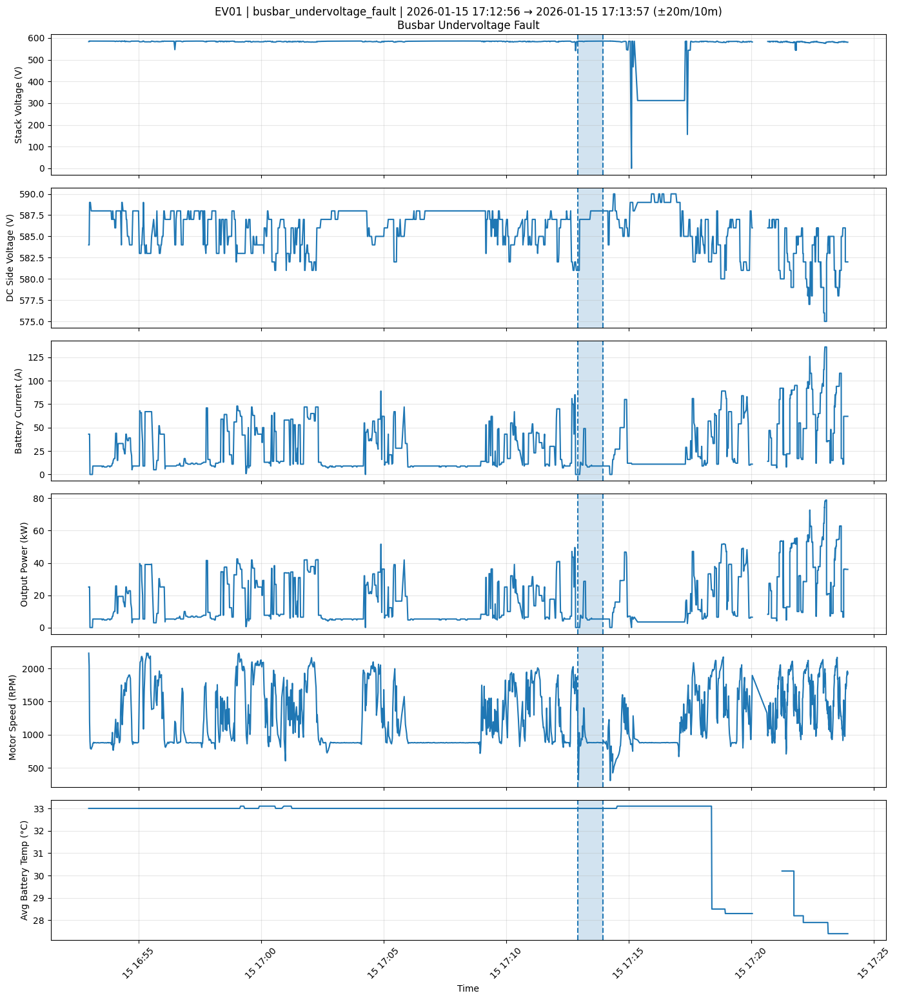

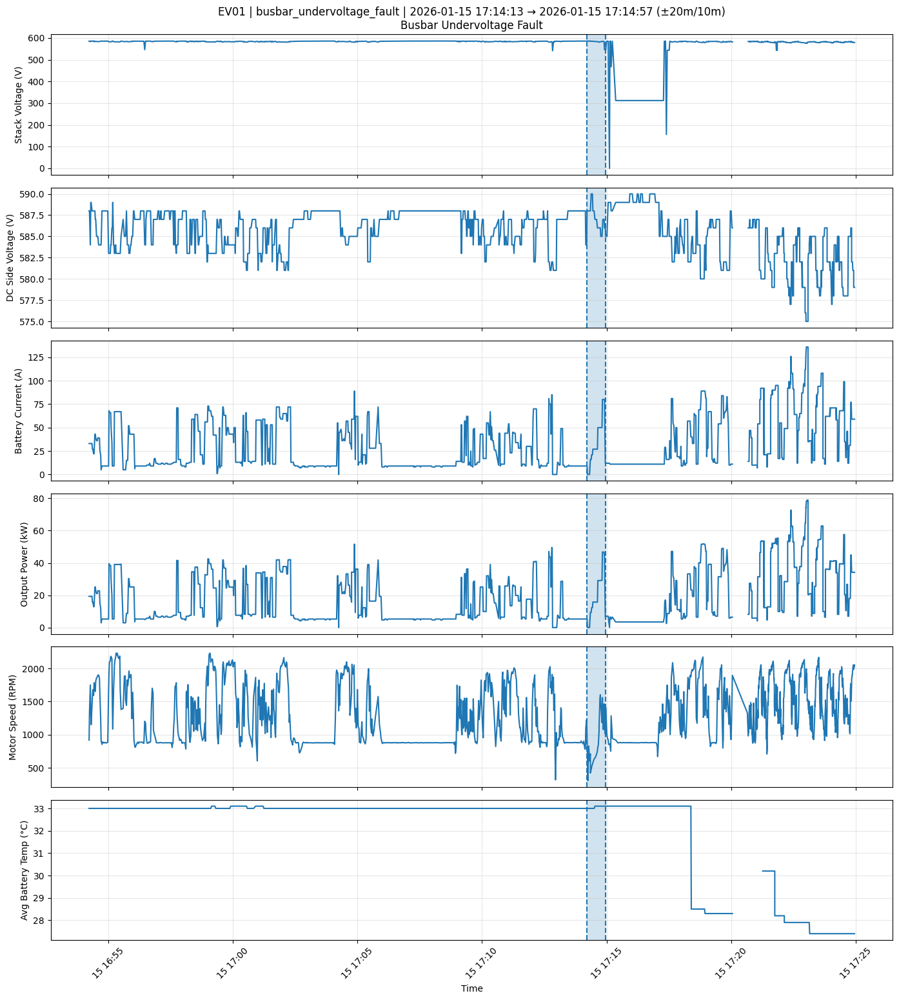

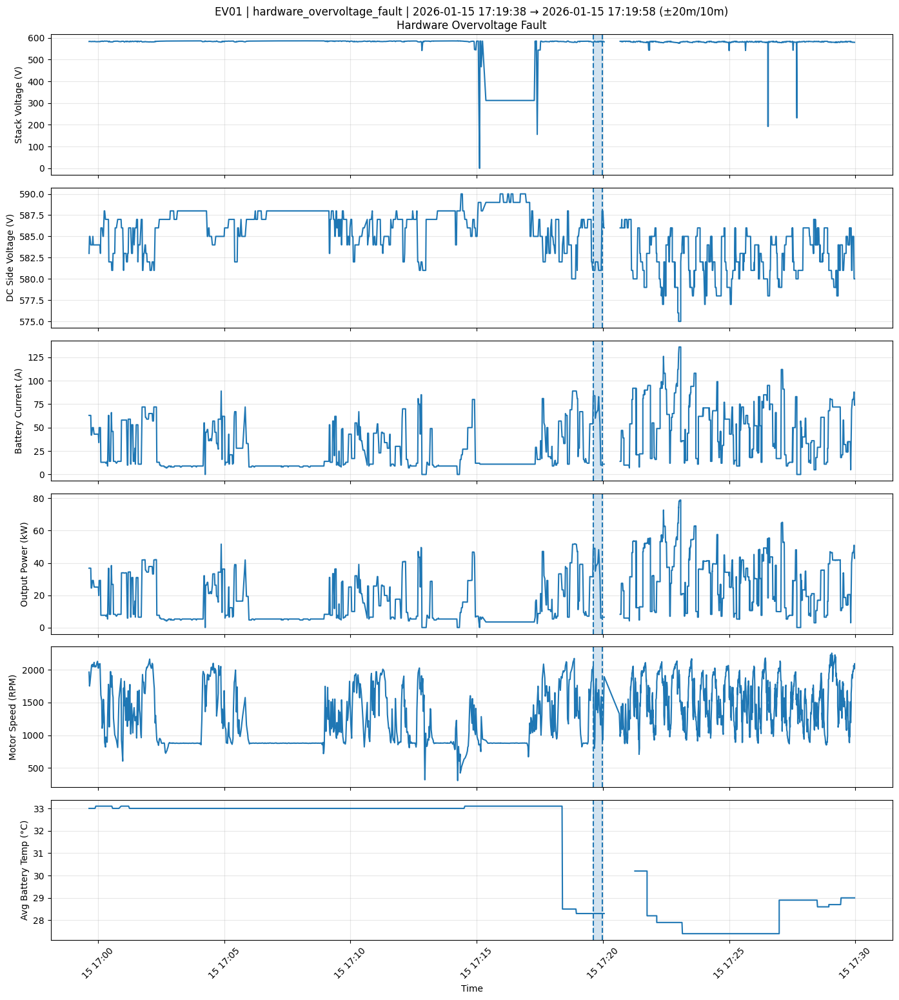

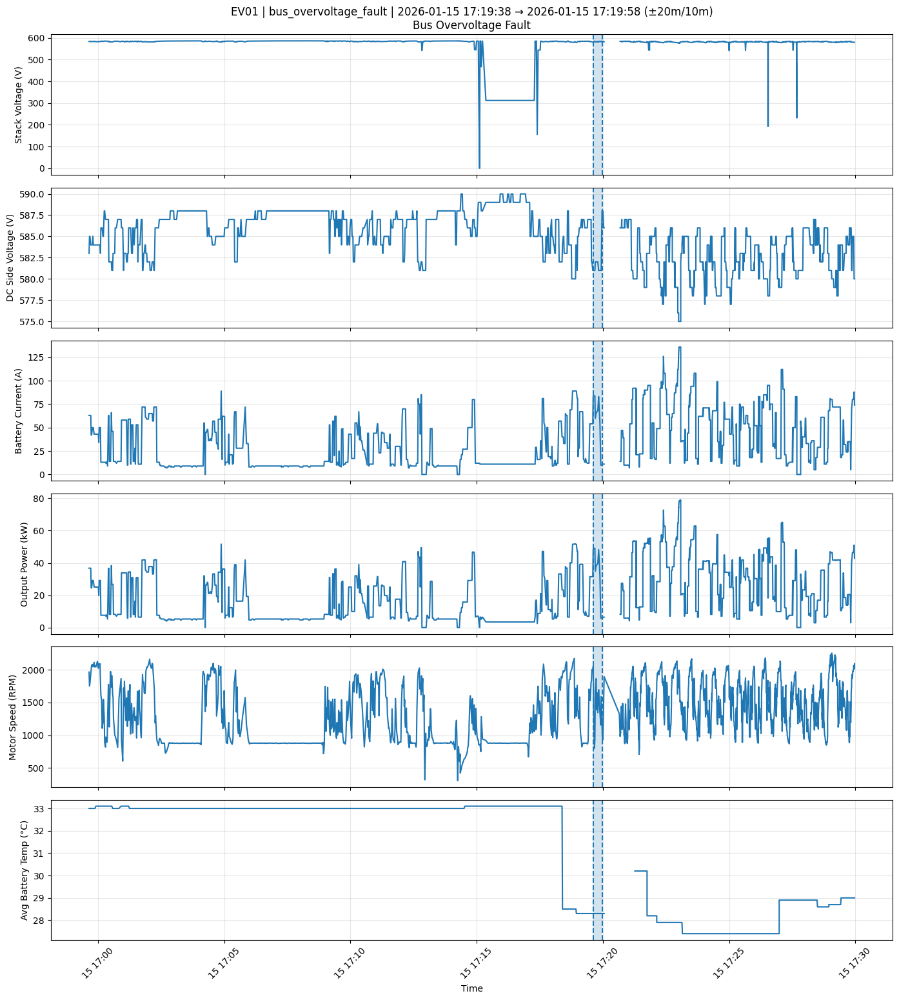

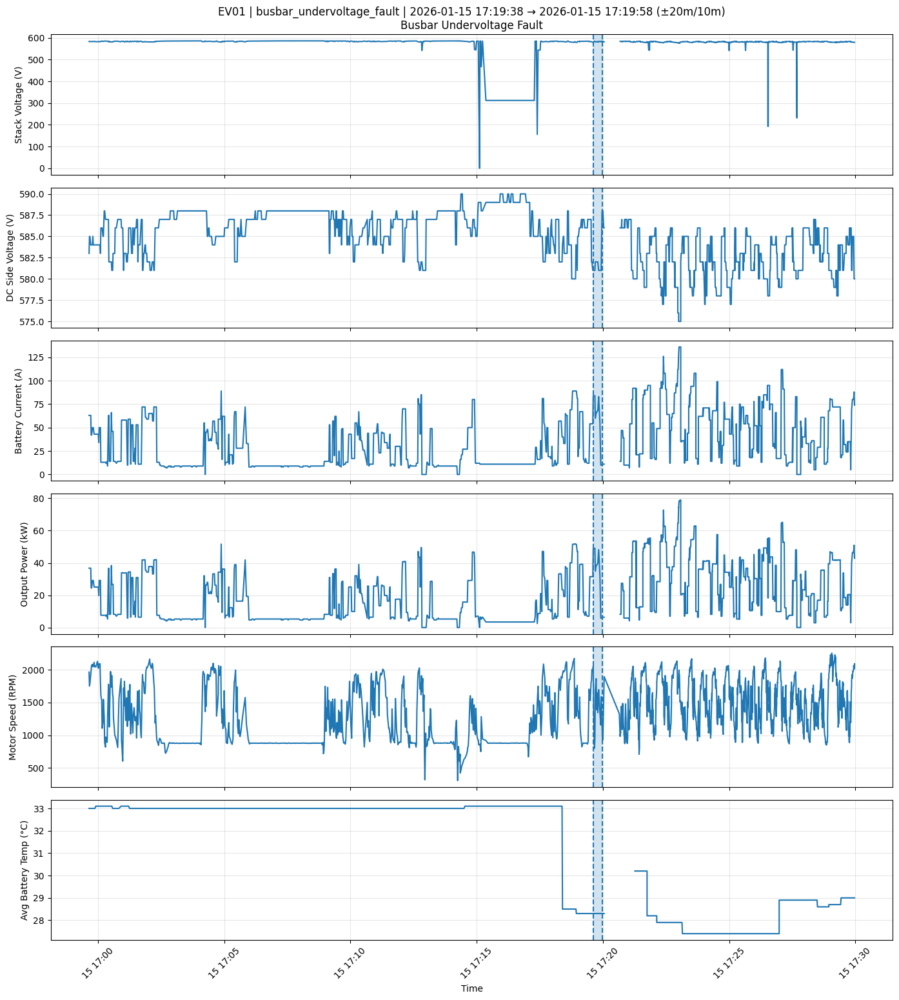

...

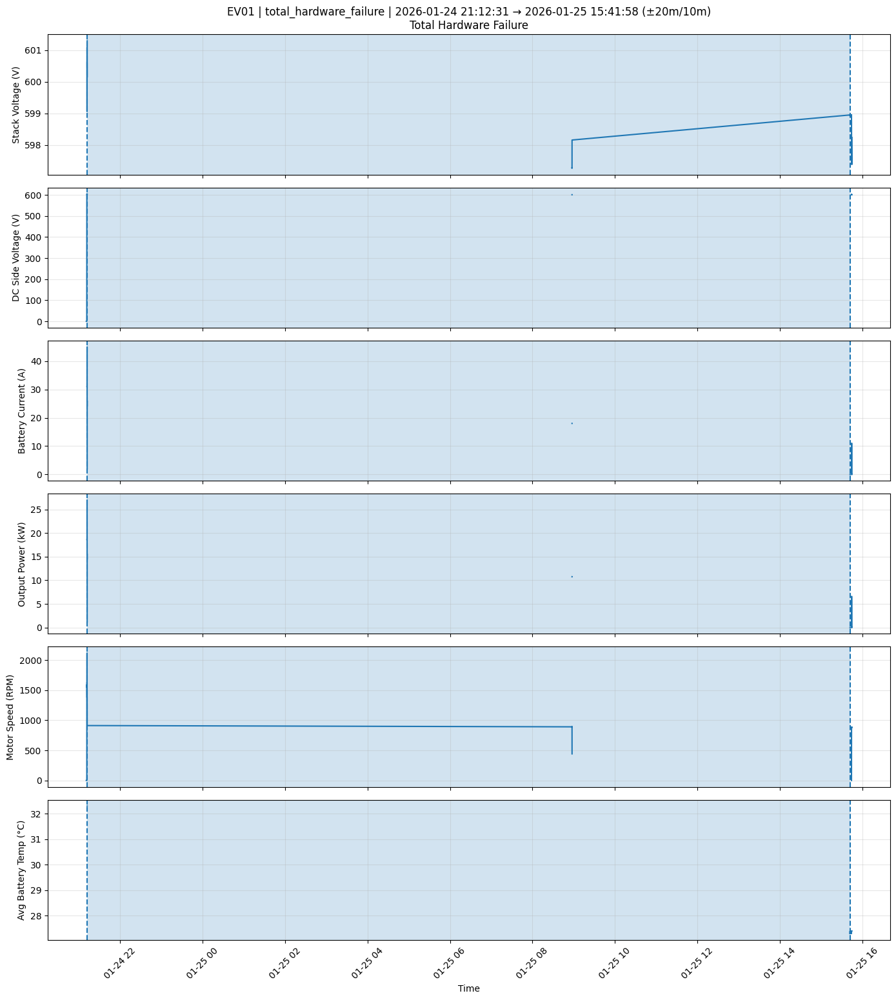

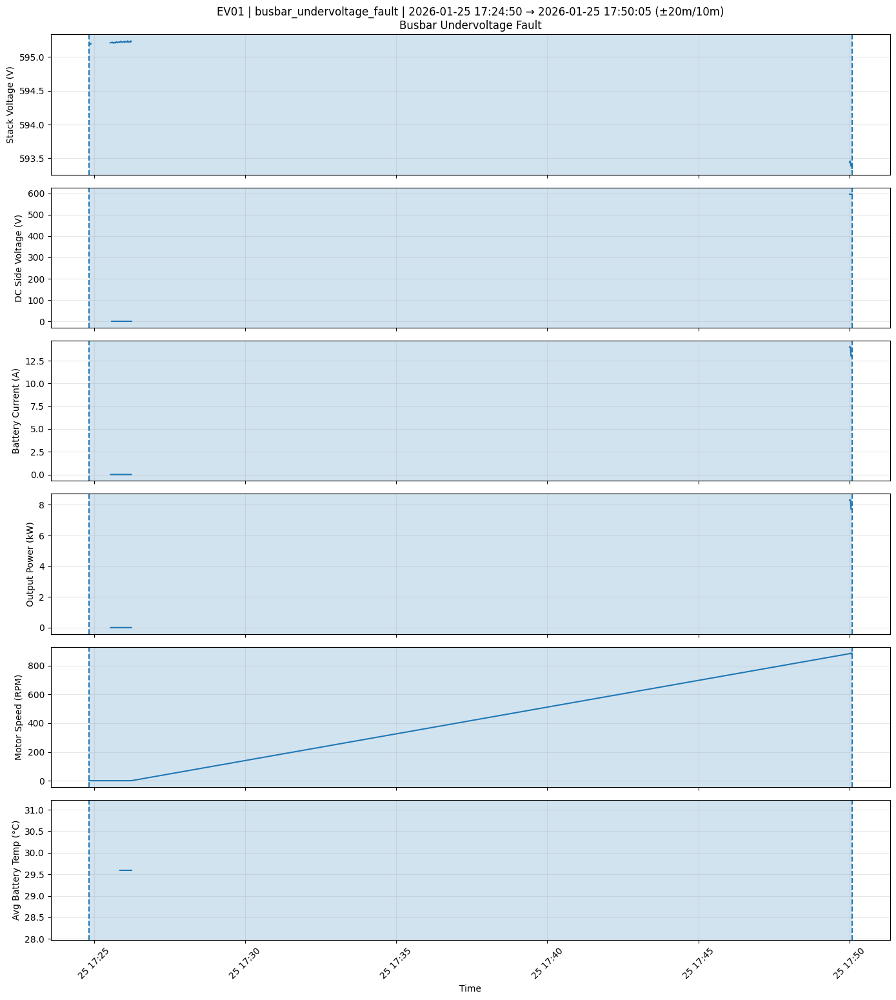

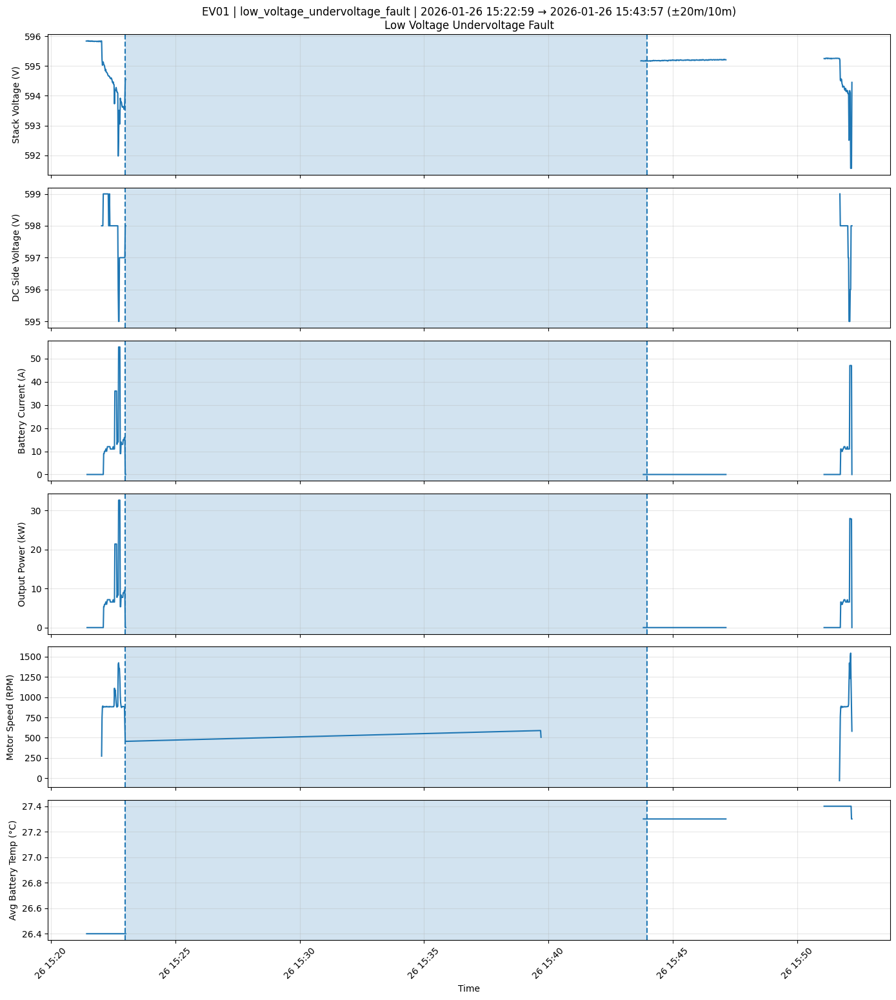

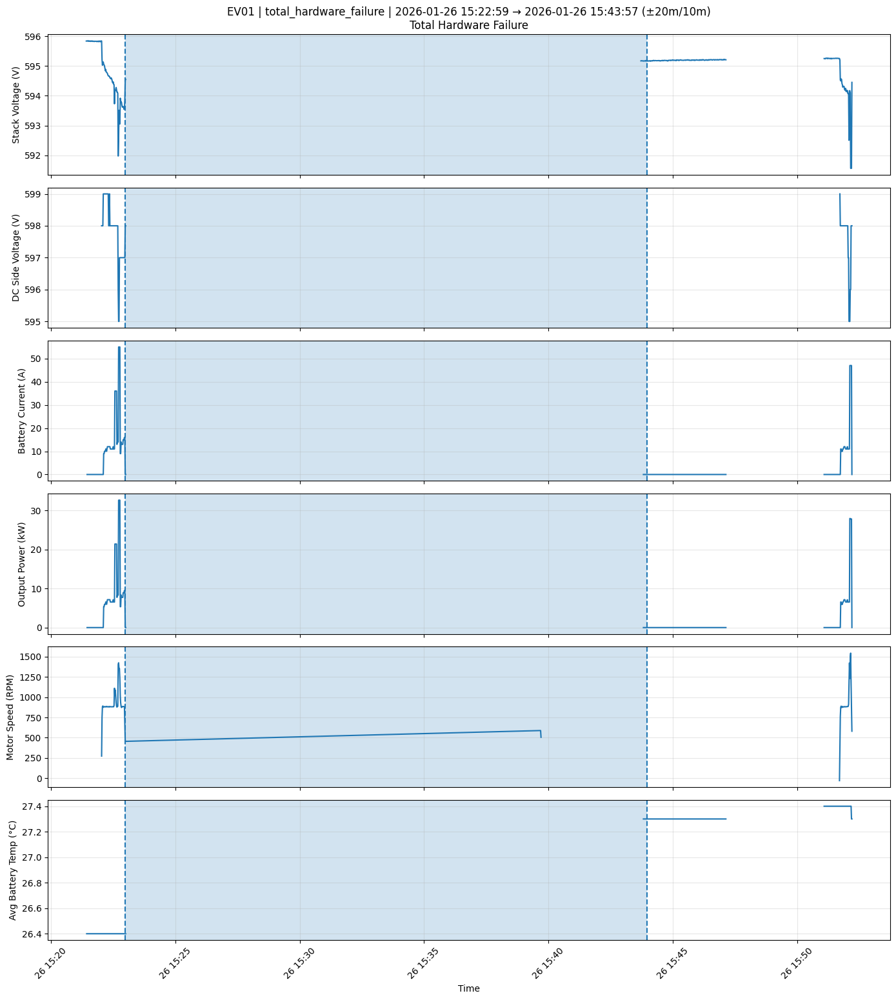

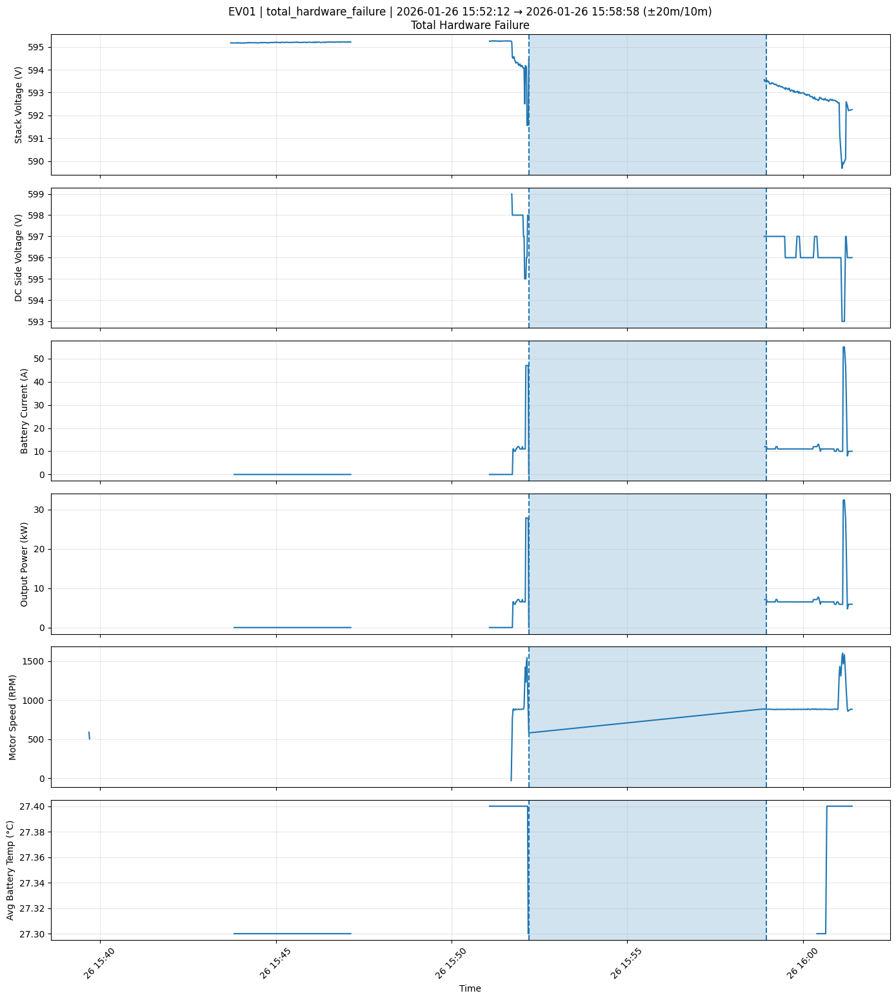

Saved plots to: fault_report_outputs


In [8]:
# -------------------------
# Plot: zoom windows around each fault
# Saves PNGs to OUT_DIR
# -------------------------
def plot_fault_window(frow, idx: int):
    act = frow.activated_at
    fix = frow.fixed_at

    start = act - pd.Timedelta(minutes=PRE_MIN)
    end = fix + pd.Timedelta(minutes=POST_MIN)
    seg = tel[(tel.timestamp >= start) & (tel.timestamp <= end)].copy()
    if len(seg) == 0:
        return

    fig, axes = plt.subplots(len(signals), 1, figsize=(14, 2.6*len(signals)), sharex=True)
    if len(signals) == 1:
        axes = [axes]

    for ax, (c, lbl) in zip(axes, signals):
        ax.plot(seg.timestamp, seg[c])
        ax.set_ylabel(lbl)
        ax.grid(True, alpha=0.3)
        ax.axvspan(act, fix, alpha=0.2)
        ax.axvline(act, linestyle="--")
        ax.axvline(fix, linestyle="--")

    title = f"{VEHICLE_ID} | {frow.code} | {act} → {fix} (±{PRE_MIN}m/{POST_MIN}m)"
    if "description" in frow.index and pd.notna(frow.get("description")):
        title += f"\n{frow.get('description')}"
    axes[0].set_title(title)
    axes[-1].set_xlabel("Time")
    plt.xticks(rotation=45)
    plt.tight_layout()

    fname = OUT_DIR / f"fault_{idx:04d}_{str(frow.code)[:40]}.png"
    fig.savefig(fname, dpi=140)
    plt.show()
    plt.close(fig)

to_plot = faults.head(MAX_PLOTS)
print(f"Plotting {len(to_plot)} faults (MAX_PLOTS={MAX_PLOTS})")
for i, r in to_plot.iterrows():
    plot_fault_window(r, i)

print("Saved plots to:", OUT_DIR)


,code,stack_voltage_v_z,dc_side_voltage_v_z,battery_current_a_z,output_power_kw_z,motor_speed_rpm_z,avg_battery_temp_c_z
0,ac_hall_failure,0.055015,0.217629,-0.574907,-0.576821,-0.528572,-0.338315
1,bus_overvoltage_fault,-0.436606,0.037202,-0.041126,-0.063002,0.328030,-0.863740
2,busbar_undervoltage_fault,-0.376566,0.074842,-0.221240,-0.227894,0.094438,-0.384337
3,hardware_overvoltage_fault,-0.537036,0.035962,-0.052305,-0.073819,0.286449,-0.446227
4,low_voltage_undervoltage_fault,0.049953,0.215673,-0.408631,-0.399379,-0.524134,0.749868
5,module_over_temperature_warning,-0.143787,0.124589,-0.214709,-0.223196,-0.005410,-0.473715
6,software_overcurrent_fault,0.075780,0.165654,-0.305944,-0.290855,0.237617,-0.459521
7,temperature_difference_failure,-0.840419,-0.165269,0.021880,-0.000507,0.469273,-0.964120
8,total_hardware_failure,-0.412355,0.036666,-0.195443,-0.209804,0.183025,0.033586


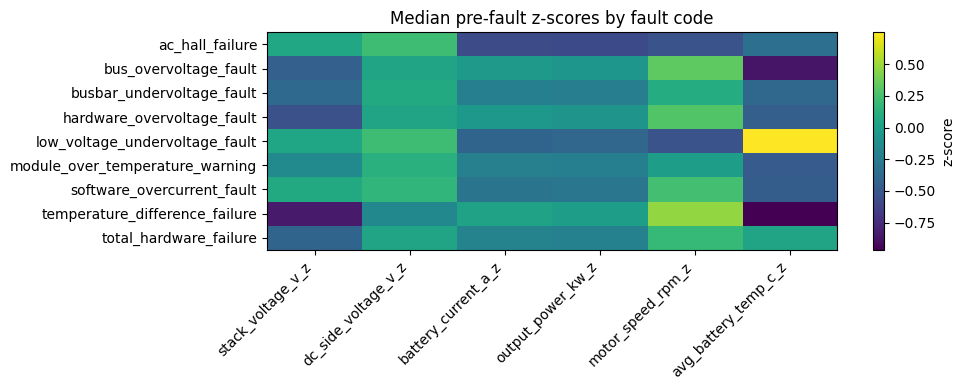

In [9]:
# -------------------------
# Aggregate: median z-scores per fault code + heatmap
# -------------------------
if len(summary) == 0:
    raise RuntimeError("Summary is empty. Check that telemetry and fault timestamps overlap.")

z_cols = [c for c in summary.columns if c.endswith("_z")]
agg = summary.groupby("code")[z_cols].median(numeric_only=True).reset_index()
agg = agg.sort_values("code")

display(agg)

vals = agg[z_cols].to_numpy(dtype=float)
plt.figure(figsize=(max(10, 0.7*len(z_cols)), max(4, 0.4*len(agg))))
plt.imshow(vals, aspect='auto')
plt.yticks(range(len(agg)), agg['code'])
plt.xticks(range(len(z_cols)), z_cols, rotation=45, ha='right')
plt.title("Median pre-fault z-scores by fault code")
plt.colorbar(label="z-score")
plt.tight_layout()
plt.show()


## What to share with me

1. `fault_report_outputs/fault_prewindow_summary.csv`
2. 2–5 plots from `fault_report_outputs/fault_*.png`
3. Screenshot of the median z-score heatmap

With those, I can tell you which faults have real predictive signatures.
